In [62]:
from matplotlib.pyplot import plot
import json
from pathlib import Path
from collections import OrderedDict
import numpy as np
import pandas as pd

stats_dict = OrderedDict()
for model in Path("../models").iterdir():
    if model.stem == "rs" or not model.is_dir(): continue
    stats_dict[model.stem] = []
    for run in model.iterdir():
        with open(run / "stats.json") as f:
            clusters_run_stats = json.load(f)
            stats_dict[model.stem].extend(list(clusters_run_stats.values())[0])
            
            # remove repeated stats (bug from other code)
            seen = set()
            final = list()
            for stat in stats_dict[model.stem]:
                if (stat["run"], stat["cluster"]) not in seen:
                    final.append(stat)
                    seen.add((stat["run"], stat["cluster"]))
            stats_dict[model.stem] = final
            

In [63]:
for model, stats in stats_dict.items():
    stats_dict[model] = [s for s in stats if s["top"] == 0] # filter top clusters results

In [64]:
info = {"model" : [], "run" : [], "avg loss" : [], "std loss" : [],  "nclusters" : [], "cluster sizes" : []}

for model, stats in stats_dict.items():
    runs = set([s["run"] for s in stats])
    for run in runs:
        run_stats = [s for s in stats if s["run"] == run]
        info["model"].append(model)
        info["run"].append(run)
        losses = [s["loss"] for s in run_stats]
        info["avg loss"].append(np.mean(losses))
        info["std loss"].append(np.std(losses))
        info["cluster sizes"].append([s["cluster_size"] for s in run_stats])
        info["nclusters"].append(len(run_stats))
    
stats_df = pd.DataFrame(info)

In [65]:
stats_df["loss+std"] = stats_df["avg loss"] + stats_df["std loss"]
stats_df

,model,run,avg loss,std loss,nclusters,cluster sizes,loss+std
0,tsne_agg_alpha,0,0.012872,0.000323,2,"[7208, 4563]",0.013195
1,tsne_agg_alpha,1,0.015585,0.002128,3,"[4563, 3333, 3875]",0.017713
2,tsne_agg_alpha,2,0.016447,0.002643,4,"[3333, 2271, 3875, 2292]",0.019090
3,tsne_agg_alpha,3,0.015261,0.002473,5,"[3875, 2271, 1513, 2292, 1820]",0.017734
4,tsne_agg_alpha,4,0.017368,0.001762,6,"[2271, 1760, 1513, 2292, 1820, 2115]",0.019131
...,...,...,...,...,...,...,...
61,pca_kmeans_mag,1,0.016543,0.014291,3,"[5618, 3407, 2746]",0.030834
62,pca_kmeans_mag,2,0.013838,0.012500,4,"[3672, 2473, 1845, 3781]",0.026338
63,pca_kmeans_mag,3,0.018641,0.020304,5,"[2977, 2316, 1628, 3258, 1592]",0.038945
64,pca_kmeans_mag,4,0.014663,0.013338,6,"[1555, 1984, 1371, 2814, 1210, 2837]",0.028002


In [66]:
top10 = stats_df.nsmallest(10, "loss+std").index
stats_df.loc[top10]

,model,run,avg loss,std loss,nclusters,cluster sizes,loss+std
41,quantile_pca_kmeans,0,0.011253,0.001576,2,"[4563, 7208]",0.012830
0,tsne_agg_alpha,0,0.012872,0.000323,2,"[7208, 4563]",0.013195
12,tsne_kmeans_alpha,0,0.013495,0.000149,2,"[4563, 7208]",0.013645
52,quantile_pca_agg,0,0.012492,0.001244,2,"[7208, 4563]",0.013737
9,pca_kmeans_alpha,0,0.012952,0.000940,2,"[4563, 7208]",0.013891
15,pca_agg_alpha,0,0.013753,0.000364,2,"[7208, 4563]",0.014117
45,ts_kmeans_alpha,0,0.013463,0.000965,2,"[4563, 7208]",0.014428
42,quantile_pca_kmeans,1,0.011917,0.003693,3,"[4563, 3561, 3647]",0.015611
20,quantile_tsne_agg,0,0.010838,0.005766,2,"[8245, 3526]",0.016604
30,aae,5,0.012128,0.004894,5,"[2972, 2433, 1944, 2377, 2045]",0.017023


# Random Search Model (Baseline)

In [3]:
from IPython.display import Image

In [1]:
%%capture
!python ../handle_predictions.py -d ../../data/compiled -hp ../runs/4-19-val -a -cf rs -r 3 -p --no-write

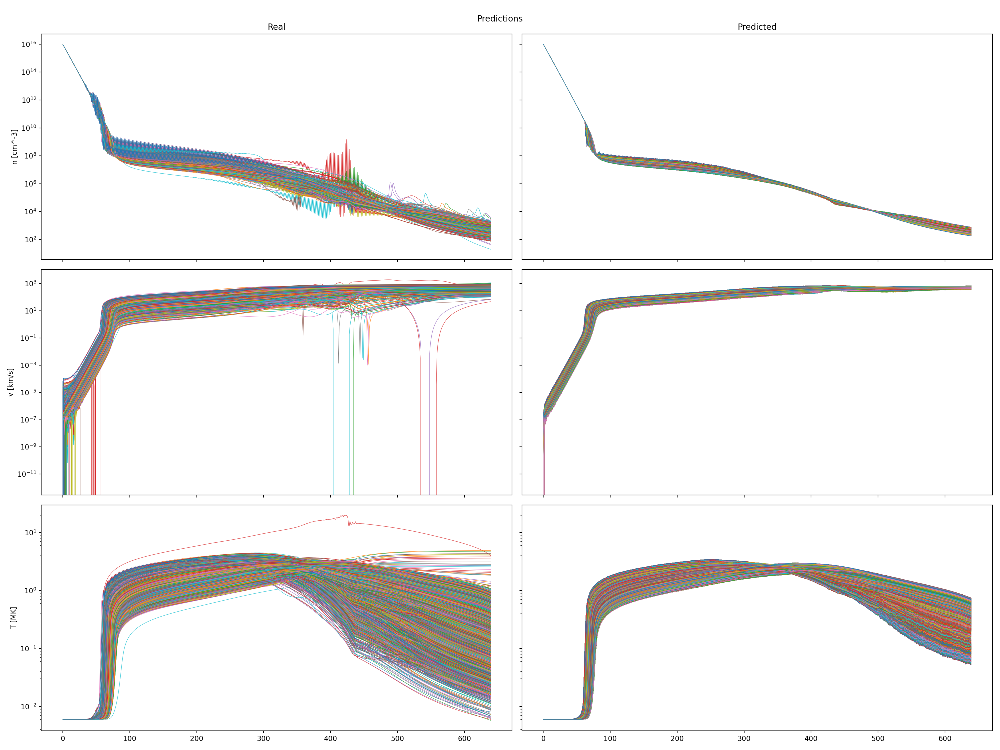

In [4]:
Image("../runs/4-19-val/predictions/all_data_t3/predictions.png")

In [5]:
Image("../runs/4-19-val/predictions/all_data_t3/predictions_val.png")

FileNotFoundError: No such file or directory: '../runs/4-19-val/predictions/all_data_t3/predictions_val.png'

FileNotFoundError: No such file or directory: '../runs/4-19-val/predictions/all_data_t3/predictions_val.png'

<IPython.core.display.Image object>

# Best Clustering Model

In [ ]:
%%capture c
!python ../handle_predictions.py -d ../../data/compiled -hp ../runs/4-19-val -cf tsne_agg_alpha -r 0 -p --no-write

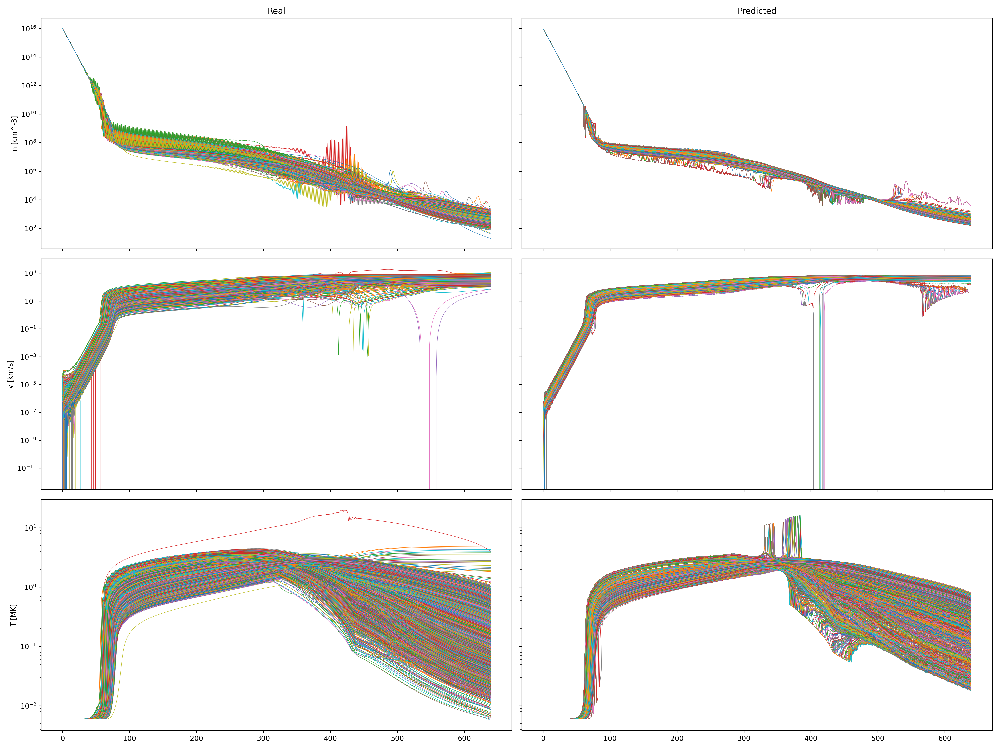

In [ ]:
Image("../runs/4-19-val/predictions/tsne_agg_alpha_0/predictions.png")

In [ ]:
Image("../runs/4-19-val/predictions/tsne_agg_alpha_0/predictions_val.png")